# Introduction

Here we aim to understand predictions of grid cells as a compression (e.g. non-negative sparse pca) of place cell activity.


In [1]:
## Setup ##
from GridModels.code.RNNs import vel2pc_RNN as v2p
v2p.options.n_steps = 100000 #long trajectory for maximal coverage
v2p.options.place_cell_rf = 0.075
navigation_activity_df = v2p.generate_navigation_rates_df(v2p.options)

navigation_activity_df

Using device: cpu


100%|██████████| 100000/100000 [02:25<00:00, 689.18it/s]


time centroid_position            velocity            \
                                   x         y         x         y   
0         0.016667          0.561652  1.424531 -0.009515 -0.092401   
1         0.033333          0.561522  1.423033 -0.007806 -0.089915   
2         0.050000          0.561351  1.421008 -0.010234 -0.121506   
3         0.066667          0.561192  1.418876 -0.009521 -0.127893   
4         0.083333          0.560972  1.416578 -0.013231 -0.137899   
...            ...               ...       ...       ...       ...   
99995  1666.600000          1.425946  1.012810  0.087499 -0.005879   
99996  1666.616667          1.427303  1.012624  0.081458 -0.011162   
99997  1666.633333          1.428516  1.012397  0.072747 -0.013648   
99998  1666.650000          1.429851  1.012097  0.080127 -0.017998   
99999  1666.666667          1.431086  1.011802  0.074080 -0.017663   

      head_direction                         firingrate                ...  \
                   x         y    degrees  place_cell_0  place_cell_1  ...   
0          -0.111732 -0.993738 -96.415176 -1.032840e-39 -2.824988e-39  ...   
1          -0.108931 -0.994049 -96.253677 -1.227248e-39 -3.357604e-39  ...   
2          -0.106156 -0.994350 -96.093760 -1.548566e-39 -4.238264e-39  ...   
3          -0.102615 -0.994721 -95.889774 -1.975648e-39 -5.409628e-39  ...   
4          -0.101825 -0.994802 -95.844288 -2.573207e-39 -7.048172e-39  ...   
...              ...       ...        ...           ...           ...  ...   
99995       0.969111  0.246625  14.277858 -5.454368e-51 -3.146342e-49  ...   
99996       0.978629  0.205633  11.866533 -4.769635e-51 -2.763975e-49  ...   
99997       0.986538  0.163531   9.411881 -4.251138e-51 -2.473668e-49  ...   
99998       0.992543  0.121896   7.001514 -3.759155e-51 -2.197379e-49  ...   
99999       0.996541  0.083099   4.766734 -3.359182e-51 -1.971882e-49  ...   

                                                                   \
      place_cell_502 place_cell_503 place_cell_504 place_cell_505   
0       4.143784e-01  -7.036041e-26  -7.258421e-14  -3.870285e-05   
1       4.194226e-01  -8.121963e-26  -8.002076e-14  -4.099399e-05   
2       4.258584e-01  -9.857100e-26  -9.125526e-14  -4.429606e-05   
3       4.322899e-01  -1.207867e-25  -1.046889e-13  -4.804938e-05   
4       4.380717e-01  -1.503907e-25  -1.215197e-13  -5.241437e-05   
...              ...            ...            ...            ...   
99995  -4.448621e-14  -3.699052e-28  -3.963763e-29  -2.562179e-11   
99996  -4.062983e-14  -3.367250e-28  -3.494388e-29  -2.359769e-11   
99997  -3.739563e-14  -3.107661e-28  -3.127772e-29  -2.193155e-11   
99998  -3.407504e-14  -2.853234e-28  -2.772052e-29  -2.023585e-11   
99999  -3.124779e-14  -2.639036e-28  -2.480218e-29  -1.878456e-11   

                                                                   \
      place_cell_506 place_cell_507 place_cell_508 place_cell_509   
0      -7.337757e-41  -1.548647e-27  -7.463801e-21  -2.991421e-34   
1      -8.619374e-41  -1.742756e-27  -8.151248e-21  -3.462782e-34   
2      -1.071355e-40  -2.044258e-27  -9.182013e-21  -4.219637e-34   
3      -1.347790e-40  -2.419917e-27  -1.041672e-20  -5.198479e-34   
4      -1.721636e-40  -2.893962e-27  -1.189642e-20  -6.493236e-34   
...              ...            ...            ...            ...   
99995  -2.691107e-19  -1.272653e-08  -7.134551e-04  -1.327909e-15   
99996  -2.650161e-19  -1.257496e-08  -7.064093e-04  -1.299978e-15   
99997  -2.626475e-19  -1.247841e-08  -7.014288e-04  -1.280770e-15   
99998  -2.610431e-19  -1.240233e-08  -6.969603e-04  -1.264063e-15   
99999  -2.598836e-19  -1.234147e-08  -6.931312e-04  -1.250113e-15   

                                     
      place_cell_510 place_cell_511  
0       4.212206e-02  -2.142709e-26  
1       5.169532e-02  -2.434438e-26  
2       6.510989e-02  -2.892512e-26  
3       7.981450e-02  -3.469612e-26  
4       9.636178e-02  -4.211825e-26  
...              ...      

## Position Encoding Lagrangean 

Here we look at grid cells under the lens of pattern formation theory for the position encoding problem. Here we follow Sorscher et al. 2019.

$$\mathcal{E}(G,W) = \mid \mid P- \hat{P} \mid\mid^2_F, \qquad \hat{P}=GW $$

- $P\in \mathbb{R}^{n_x\times n_P}$ denotes place cell activations for different positions, such that $P_{x,i}$ is the activity of place cell $i$ at location $x$. 
- $G\in \mathbb{R}^{n_x\times n_G}$ denotes grid cell activations, such that $G_{x,j}$ is the activity of grid cell $j$ at location $x$.
- $W \in \mathbb{R}^n_G\times n_P$ represents readout weights, such that $W_{j,i}$ is the contribution of grid cell $j$ to place cell $i$ activity predictions.
- $\hat{P}\in \mathbb{R}^{n_x\times n_P}$ denotes predicted place cell activations.


Since we care mostly about $G$, we assume that $W$ is optimal for a fixed $G$:
$$ W := \argmin_W \mathcal{E}(G,W) \approx (G^T G)^{-1}G^T P$$
noting that with some matrix algebra this implies
$$ W \approx G^{-1}(G^{T})^{-1} G^T P =  G^{-1} P \implies GW=\hat{P}$$

Now there's some more matrix hacks: the objective $\mathcal{E}$ is the same under linear transformations, so we can simplify it by a transformation $Z$ so that $G$ has orthonormal columns:

$$G\to GZ, W\to Z^{-1}W$$

which can be enforced via Lagrange multipliers:
$$ \mathcal{L}=\text{Tr} [G^T \sum G - \lambda(G^TG-I)], \qquad \sum=PP^T$$


In [61]:
from GridMaze.analysis.cluster_tuning import spatial
pos = navigation_activity_df.centroid_position.values
rates = navigation_activity_df.firingrate.values
ratemaps, binx, biny = spatial.get_2D_ratemaps(rates, pos, 
                                               x_size = 0.05, 
                                               y_size = 0.05)

2.3781 % of bins unoccupied


(-0.9, 18.9, -0.9, 18.9)

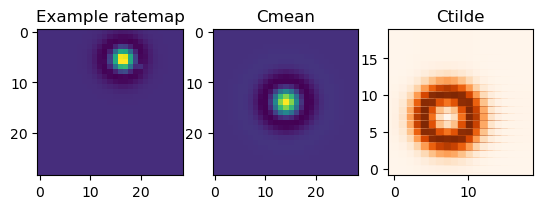

In [62]:
import matplotlib.pyplot as plt
import numpy as np
print(f'{round(np.mean(np.isnan(ratemaps))*100,4)} % of bins unoccupied')
ratemaps[np.isnan(ratemaps)] = 1e-6 # set NaN to very small value. Seems to work? But probably wont for maze data
P = ratemaps.reshape(ratemaps.shape[0],ratemaps.shape[1]*ratemaps.shape[2])
## Before any of the C stuff, we need to rescale the ratemaps ##
n_ratemaps = ratemaps.shape[0]
shifted_rm = (ratemaps + np.abs(ratemaps.min(axis = (1,2))).reshape(n_ratemaps,1,1))
ratemaps = shifted_rm/shifted_rm.max(axis = (1,2)).reshape(n_ratemaps,1,1)
# ratemaps should have values between [0,1], so they should be shifted #
res = ratemaps.shape[1]
C = P.T@P
Csquare = C.reshape(res,res,res,res)
Cmean = np.zeros([res,res])
n_additions = 0
for i in range(res):
    for j in range(res):
        Cmean += np.roll(np.roll(Csquare[i,j], -i, axis=0), -j, axis=1)
        n_additions +=1
Cmean = np.roll(np.roll(Cmean, res//2, axis=0), res//2, axis=1)/n_additions #fold the corners onto the center
# Fourier transform
Ctilde = np.fft.fft2(Cmean)
Ctilde[0,0] = 0

fig, ax = plt.subplots(1,3)
ax[0].set(title = 'Example ratemap')
ax[0].imshow(ratemaps[100])

ax[1].set(title ='Cmean')
ax[1].imshow(Cmean)

ax[2].set(title = 'Ctilde')
width = 10
idxs = np.arange(-width+1, width)
x2, y2 = np.meshgrid(np.arange(2*width-1), np.arange(2*width-1))
ax[2].scatter(x2,y2,c=np.abs(Ctilde)[idxs][:,idxs], s=600, cmap='Oranges', marker='s')
ax[2].axis('square')

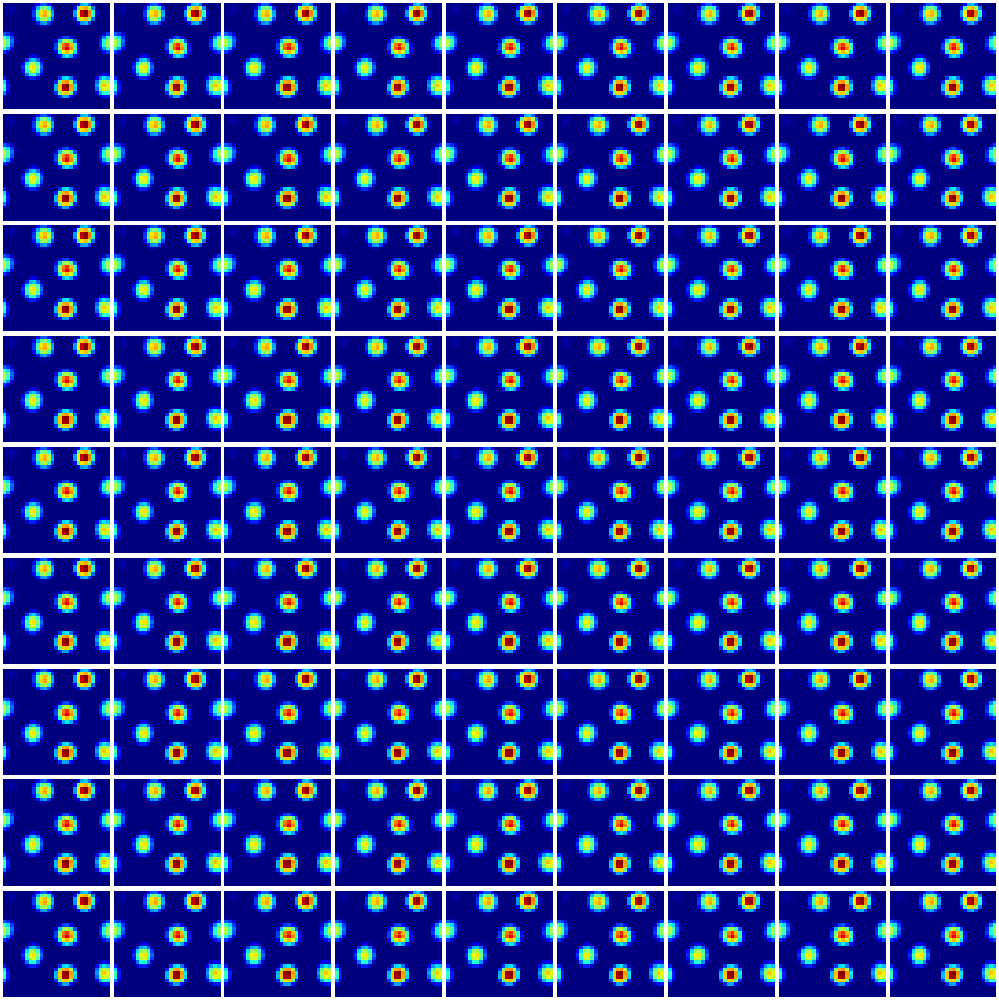

all NaN at iteration 136


/tmp/ipykernel_4168937/1070376880.py:8: RuntimeWarning: overflow encountered in multiply
  gconv = np.real(np.fft.ifft2(gtilde*Ctilde))


In [112]:
# Symmetry-breaking nonlinearity (relu)

def convolve_with_C(g, Ctilde):
    '''
    Convolves the input g with the kernel C
    '''
    gtilde = np.fft.fft2(g, [res, res])
    gconv = np.real(np.fft.ifft2(gtilde*Ctilde))
    gconv = np.roll(np.roll(gconv, res//2+1, axis=1), res//2+1, axis=2)
    
    return gconv

def relu(x):
    return np.maximum(x,0)

Ng = 9**2
n_plot_rows = int(np.sqrt(Ng))
T = 1000
lr = 5e-3

#NOTE THAT THE VARIABILITY IN ORIENTATION / PHASE DEPENDS ON INITIAL RANDOM SEED
#G = np.random.randn(Ng,res,res) * 1e-8
repeated_init = np.random.randn(res,res)*1e-8
G = np.stack([ repeated_init for _ in range(Ng)])

for i in range(T):
    G +=lr*(-G + convolve_with_C(G, Ctilde))
    G = relu(G)
    if i%100==99:
        fig, ax = plt.subplots(n_plot_rows,Ng//n_plot_rows, 
                               figsize = (4*Ng//n_plot_rows,4*n_plot_rows))
        for i, axis in enumerate(ax.flatten()):
            axis.imshow(G[i], cmap = 'jet')
            axis.axis('off')
        fig.tight_layout()
        plt.show()
    if np.all(np.isnan(G[0])):
        print(f'all NaN at iteration {i}')
        break
            

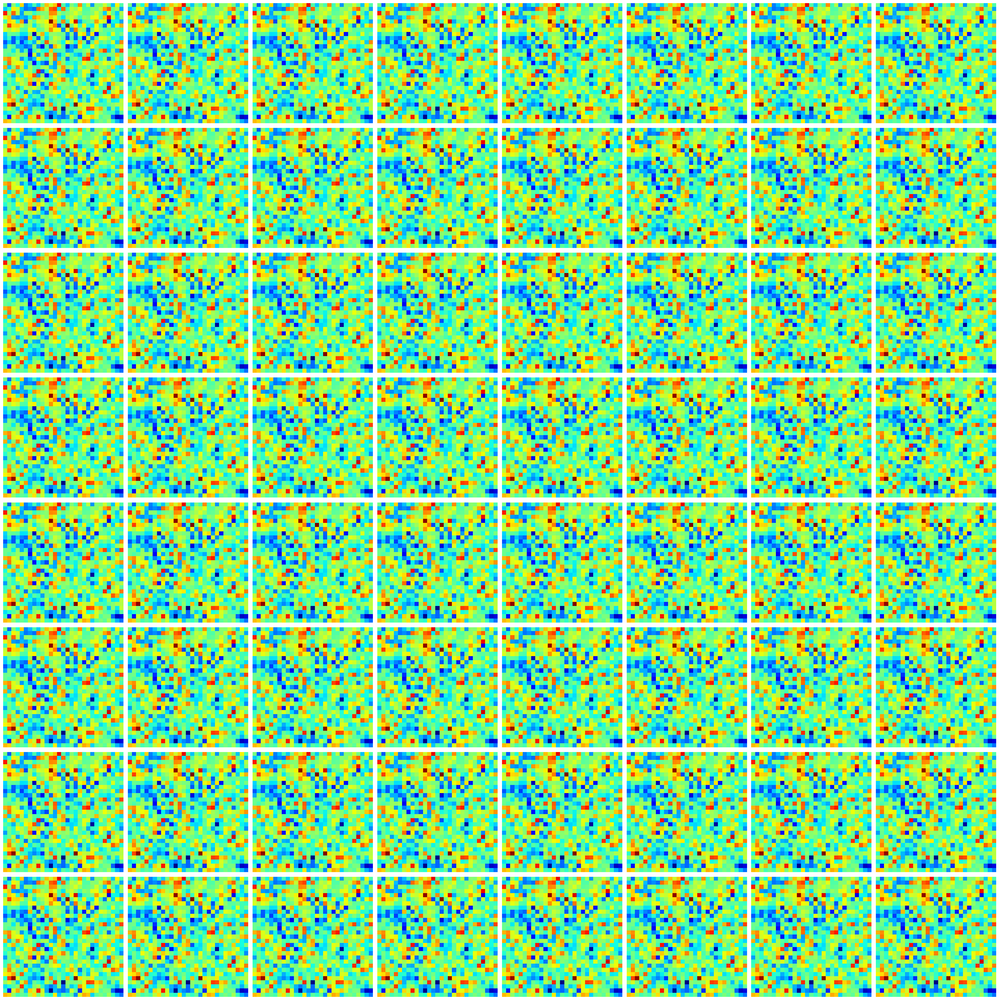

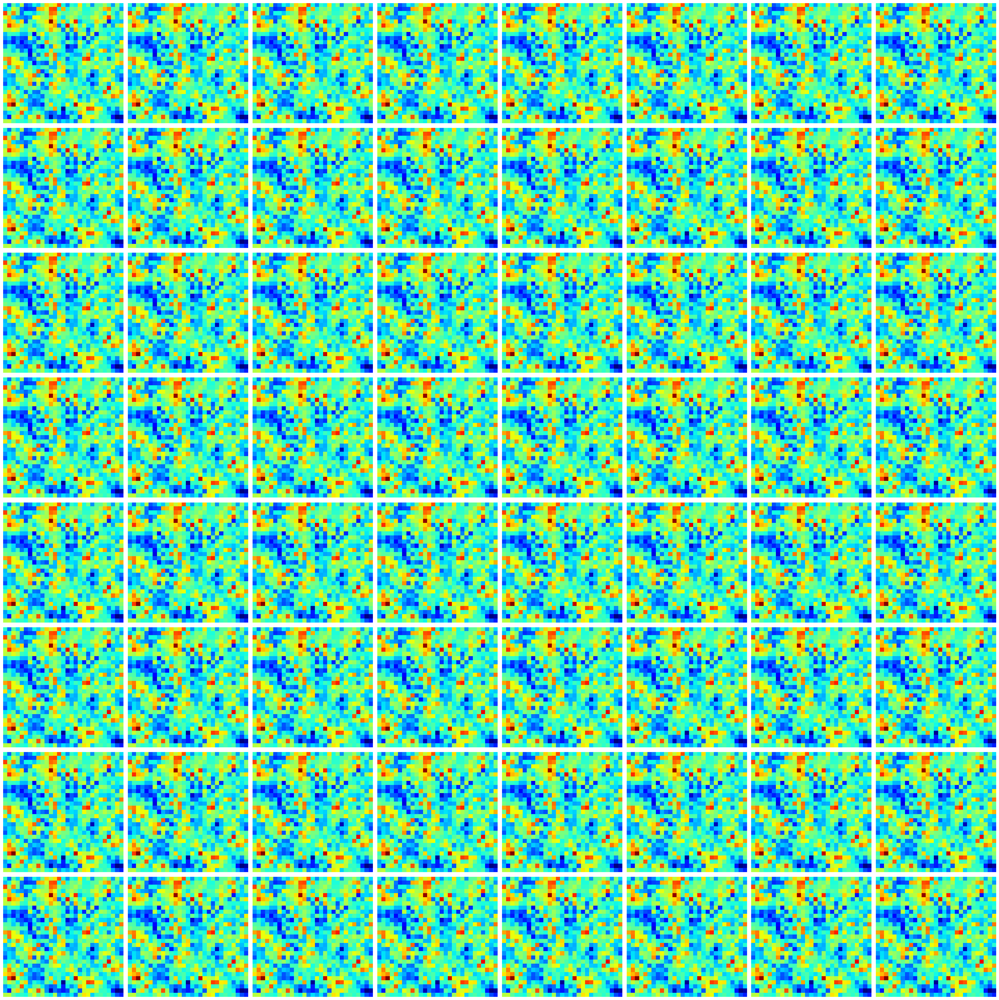

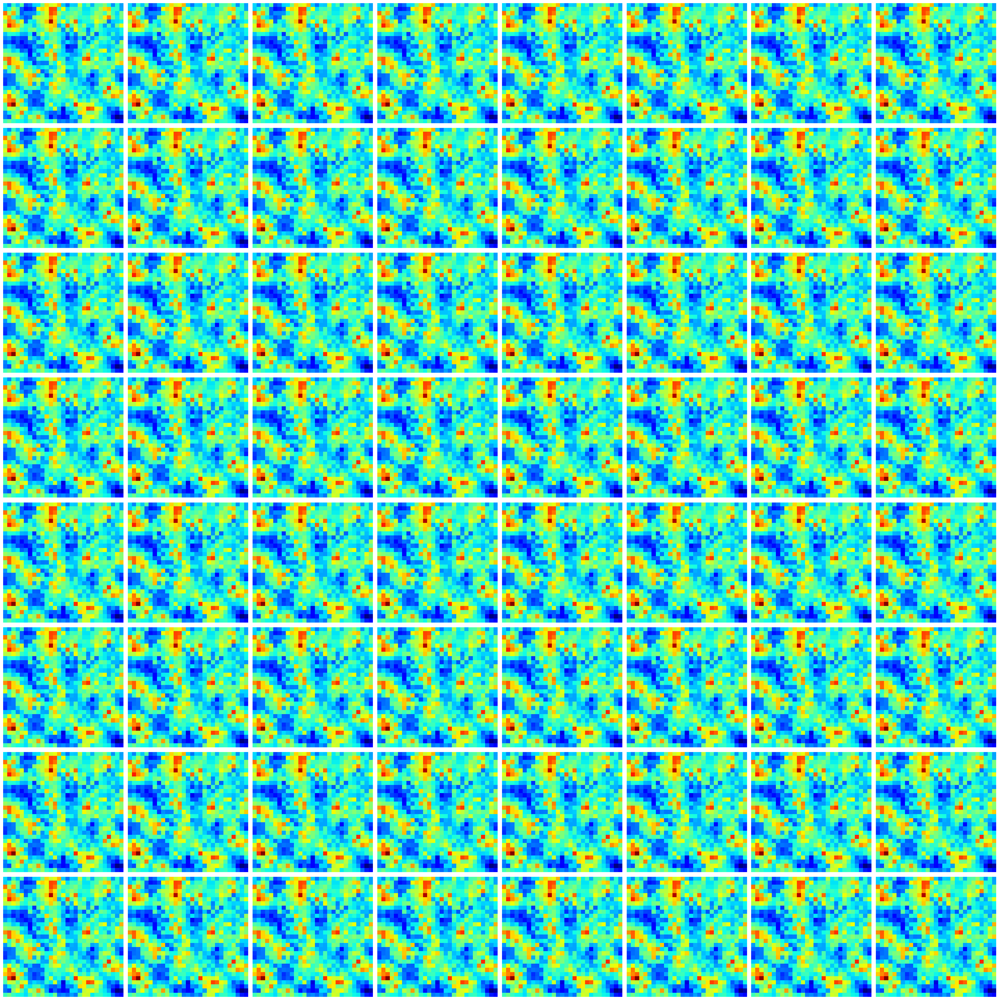

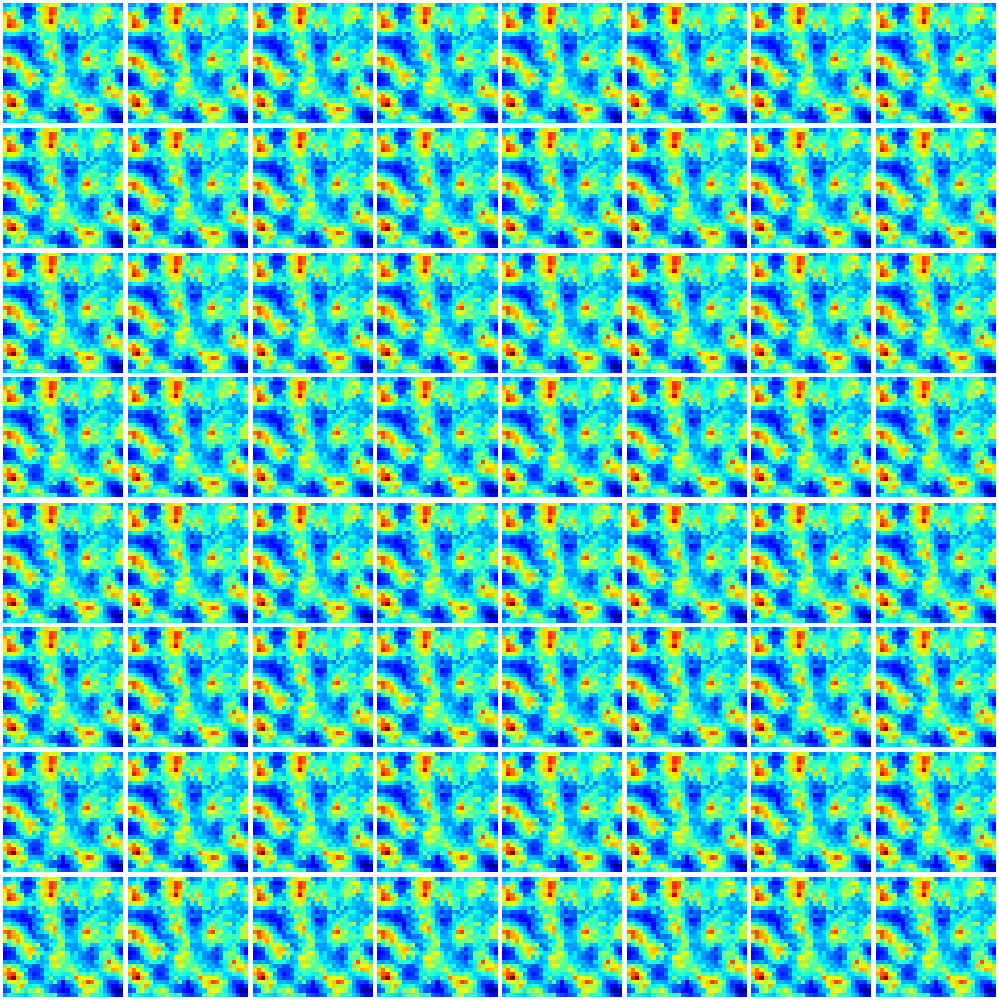

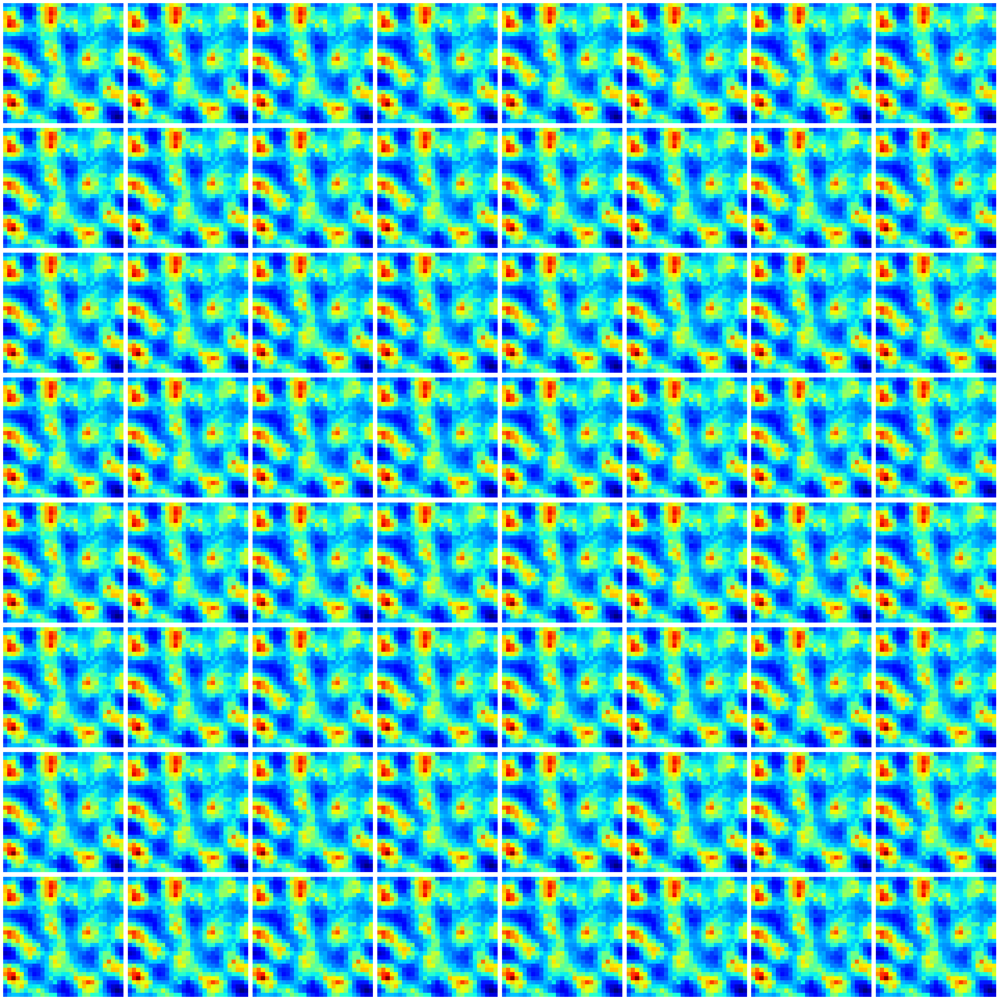

...

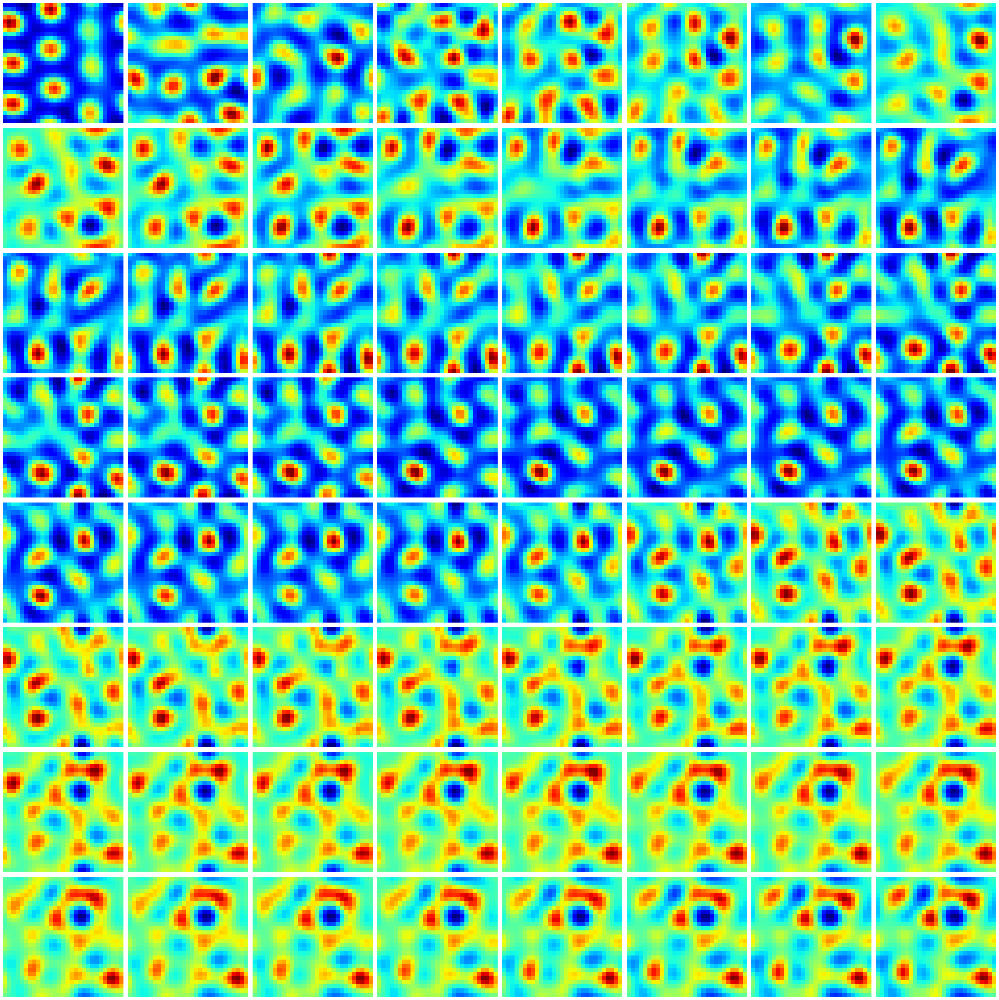

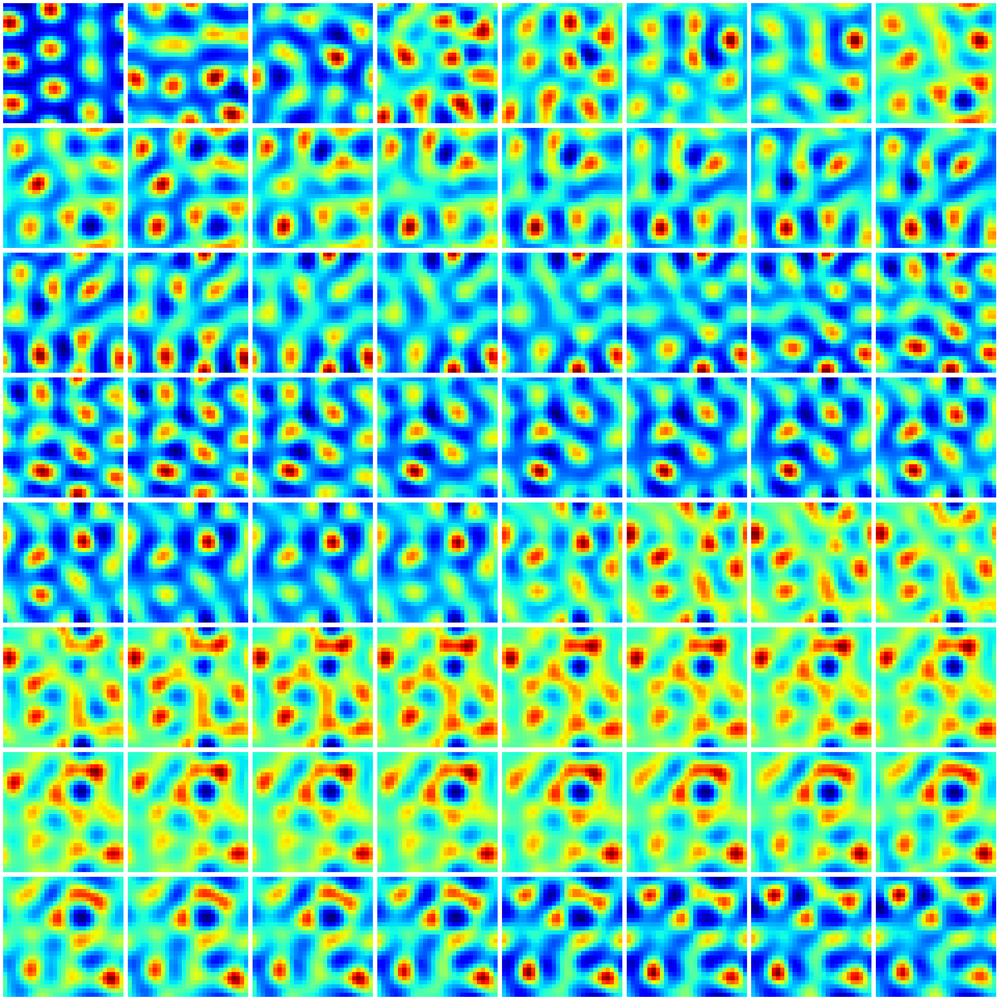

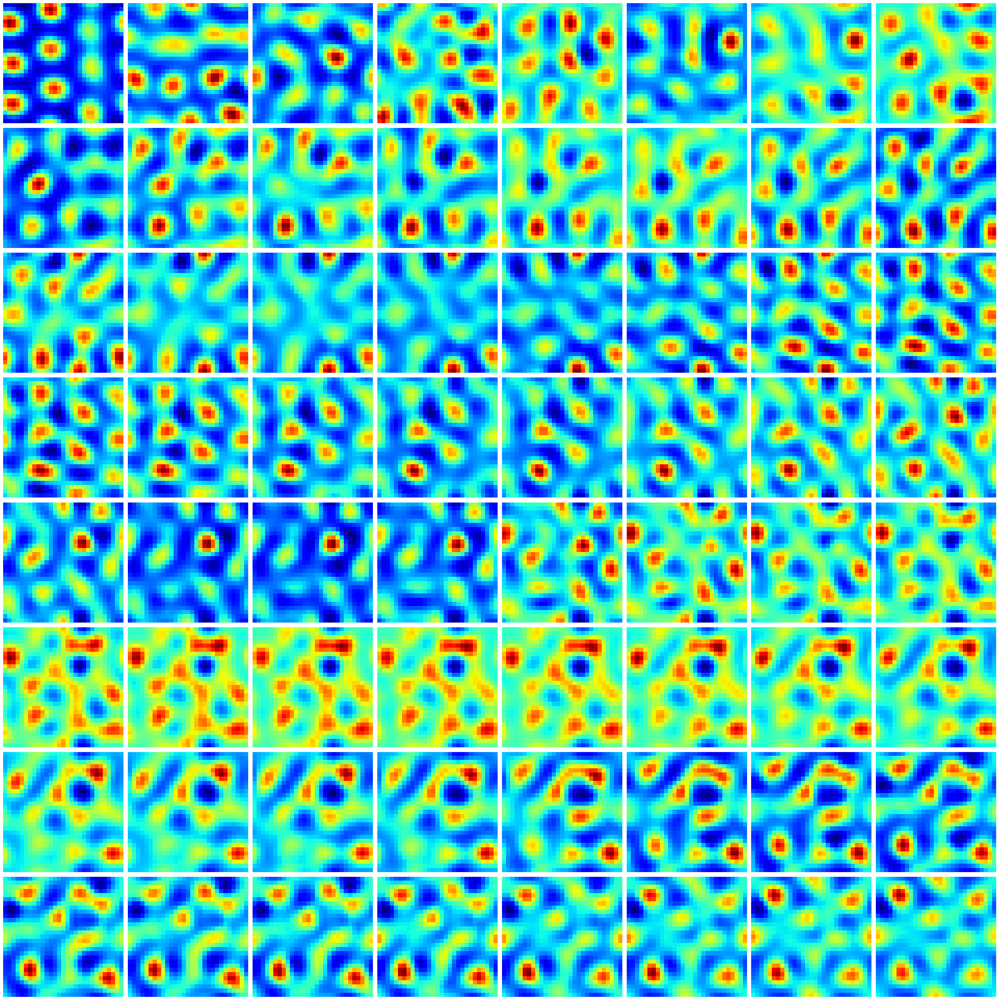

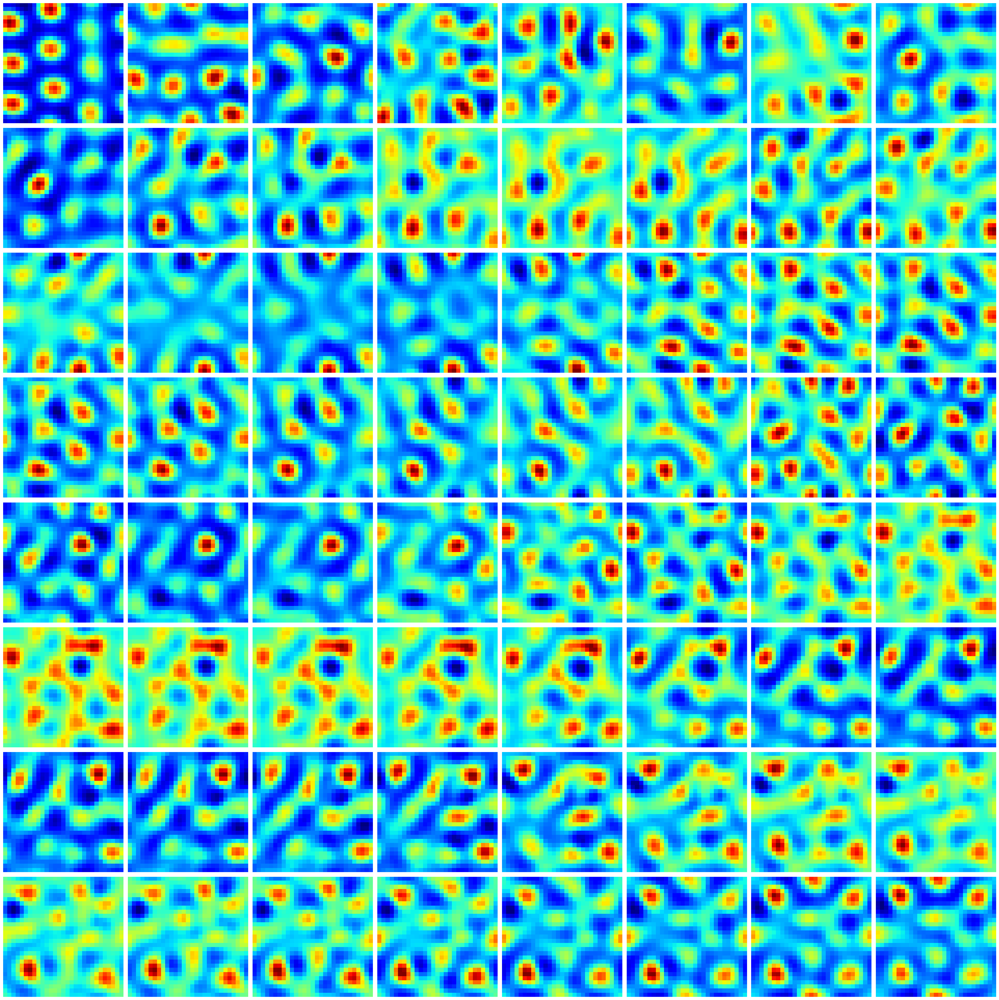

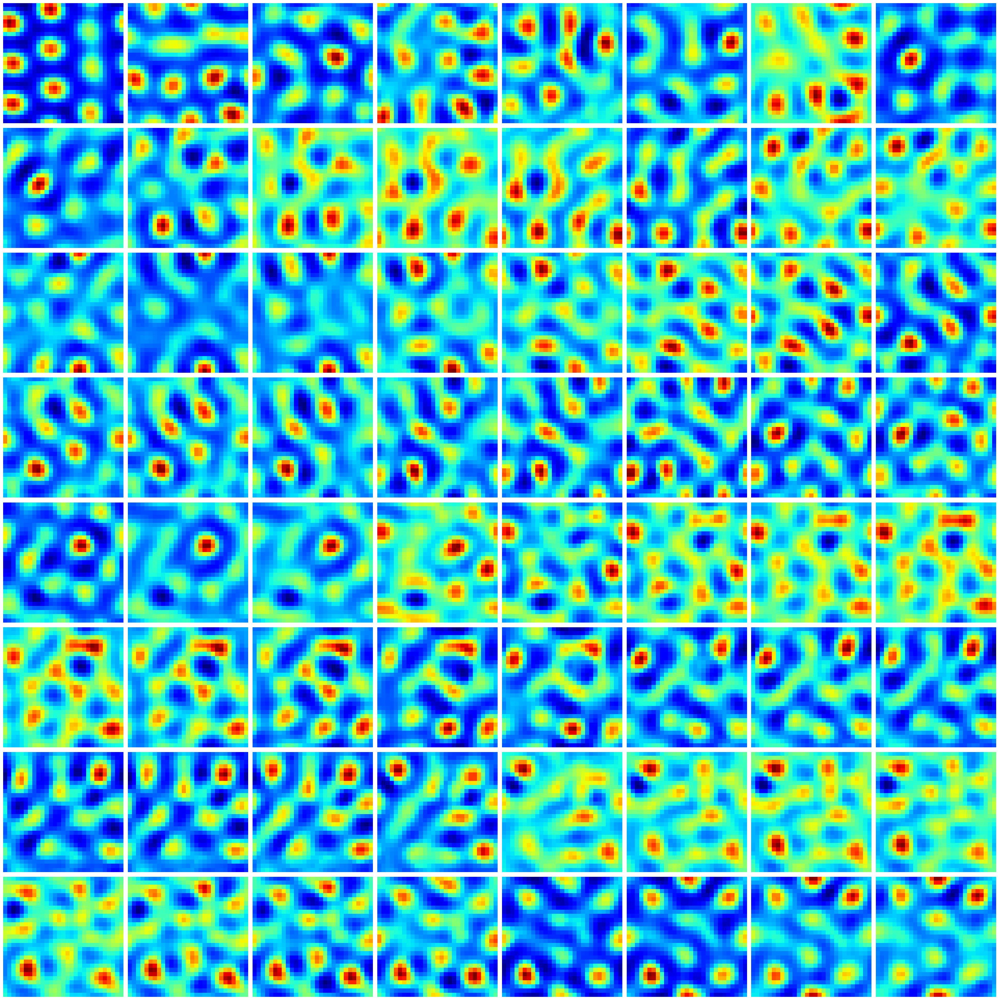

In [146]:
def phi(x,r):
    return np.maximum(r*x,0)

Ng = 8**2
n_plot_rows = int(np.sqrt(Ng))
r = 30
T = 5000
lr = 1e-7
#G = np.random.randn(Ng,res,res) * 1e-8
repeated_init = np.random.randn(res,res)*1e-8
G = np.stack([ repeated_init for _ in range(Ng)])

for i in range(T):
    H = convolve_with_C(G, Ctilde)
    #H = phi(H,r) #this is not in the original code, but could be helpful to integrate non-negativity in the orthogonalisation penalty?
    Hr = H.reshape([Ng, -1])
    Gr = G.reshape([Ng, -1])
    oja = Gr.T.dot(np.tril(Gr.dot(Hr.T))).T.reshape([Ng,res,res])
    G_relu = phi(G,r)
    #we should balance constraints
    balance_scalar = np.abs(H-oja).max()/np.abs(G_relu).max() # 1 #np.min([H.max(),oja.max()])/G_relu.max() #(np.abs(H-oja).max()/np.abs(G_relu).max())
    G += lr * (H - oja + balance_scalar*G_relu) 
    
    if i%100==99:
        fig, ax = plt.subplots(n_plot_rows,Ng//n_plot_rows, 
                               figsize = (4*Ng//n_plot_rows,4*n_plot_rows))
        for i, axis in enumerate(ax.flatten()):
            axis.imshow(np.flip(G)[i], cmap = 'jet')
            axis.axis('off')
        fig.tight_layout()
        plt.show()
    if np.all(np.isnan(G[0])):
        print(f'all NaN at iteration {i}')
        break